Finally have made my own database connecting Ways and nodes via Nominatim (but not without its problems: street name short form problem).

In [1]:
using Pkg
Pkg.activate(".")
using DataFrames
using SQLite
using Plots
using Dates
using Distributions

In [34]:
using LinearAlgebra

In [49]:
using StatPlots

┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1186
┌ Info: Precompiling IterableTables [1c8ee90f-4401-5389-894e-7a04a3dc0f4d]
└ @ Base loading.jl:1186
┌ Info: Precompiling Widgets [cc8bc4a8-27d6-5769-a93b-9d913e69aa62]
└ @ Base loading.jl:1186
┌ Info: Precompiling Clustering [aaaa29a8-35af-508c-8bc3-b662a17a0fe5]
└ @ Base loading.jl:1186
┌ Info: Precompiling KernelDensity [5ab0869b-81aa-558d-bb23-cbf5423bbe9b]
└ @ Base loading.jl:1186


In [58]:
using StatsBase

# TODO
- Per-streetsegment statistics

## Done
- Refactor database with proper datetime column instead of separate date and time columns
- Arpack (needed for Distributions.jl) won't build... try using Julia source binaries.
    - https://discourse.julialang.org/t/arpack-does-not-build-in-1-0-manjaro-linux/14515
- Per-streetsegment time-cluster analysis -- Has exponential distribution?

In [3]:
db = SQLite.DB("streetsegdb_2018_09_16/allstreetsegs.db")

SQLite.DB("streetsegdb_2018_09_16/allstreetsegs.db")

In [4]:
randid = SQLite.query(db, "select * from streetsegments where name like 'Elm Street%'")[5,:].osm_id[1]

4652041

In [5]:
randss = SQLite.query(db, "select * from streetsegments where osm_id= :randid", values = Dict(:randid => randid))

,osm_id,name,slat,nlat,wlng,elng
1,4652041,"Elm Street, Discovery District, Old Toronto, Toronto, Ontario, M5T 1V4, Canada",43.6558,43.6563,-79.392,-79.3891


In [6]:
# get all tickets associated with this street segment
randinfractions = SQLite.query(db, "select * from streetsegmentinfraction where osm_id = :randid", 
                                values = Dict(:randid => randid))

,osm_id,code,fine,loc,datetime
1,4652041,29,30,200 ELM ST,2016-01-02T00:23:00
2,4652041,406,40,200 ELM ST,2016-01-02T08:59:00
3,4652041,210,30,222 ELM ST,2016-01-03T18:10:00
4,4652041,8,60,200 ELM ST,2016-01-05T12:42:00
5,4652041,8,60,222 ELM ST,2016-01-06T13:59:00
6,4652041,14,40,222 ELM ST,2016-01-06T17:35:00
7,4652041,8,60,222 ELM ST,2016-01-07T12:20:00
8,4652041,15,100,200 ELM ST,2016-01-07T15:41:00
9,4652041,8,60,222 ELM ST,2016-01-07T19:18:00
10,4652041,8,60,222 ELM ST,2016-01-08T12:55:00


In [7]:
timedf = DateFormat("HHMM")
datedf = DateFormat("yyyymmdd")
Dates.Time("1008", timedf)
times = []
for i in 1:length(randinfractions.time)
        push!(times, Dates.Time(lpad(string(randinfractions.time[i]),4,"0"), timedf))
end
convert(Dates.Minute, (times[2] - times[1]))
datedf = DateFormat("yyyymmddHHMM")
i = 50
datestring = string(randinfractions.date[i]) * lpad(string(randinfractions.time[i]), 4, "0")
DateTime(datestring, datedf)

KeyError: KeyError: key :time not found

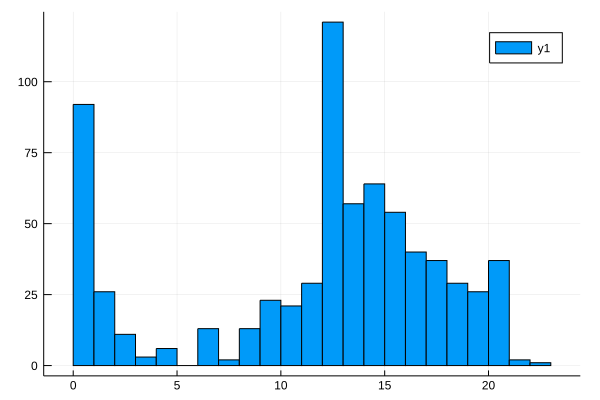

In [8]:
histogram(Dates.hour.(randinfractions.datetime), nbins=24)

There is a noticable spike in tickets at 12:00 pm and 12:00 am. Between 9:00 pm and 12:00 am is a lull in parking ticket activity. 

```{Julia}
# probably will not need to run again
# Code for converting date/time columns into a datetime column

infractions = SQLite.query(db,"select * from streetsegmentinfraction")

infractions[:datetime] = map((x,y) -> DateTime(string(x) * lpad(string(y), 4, "0"), datedf), 
                                infractions[:date],
                                infractions[:time])

delete!(infractions, :date)
delete!(infractions, :time)

# write to a database
SQLite.execute!(db, "drop table if exists streetsegmentinfraction")
SQLite.load(db, "streetsegmentinfraction", infractions)
```

In [9]:
dt_tuples = map( (x,y) -> (x,y), Dates.hour.(randinfractions.datetime), Dates.minute.(randinfractions.datetime))

707-element Array{Tuple{Int64,Int64},1}:
 (0, 23) 
 (8, 59) 
 (18, 10)
 (12, 42)
 (13, 59)
 (17, 35)
 (12, 20)
 (15, 41)
 (19, 18)
 (12, 55)
 (14, 8) 
 (0, 17) 
 (0, 18) 
 ⋮       
 (12, 27)
 (13, 12)
 (13, 31)
 (12, 55)
 (15, 35)
 (0, 14) 
 (0, 15) 
 (14, 50)
 (16, 41)
 (1, 4)  
 (0, 32) 
 (0, 37) 

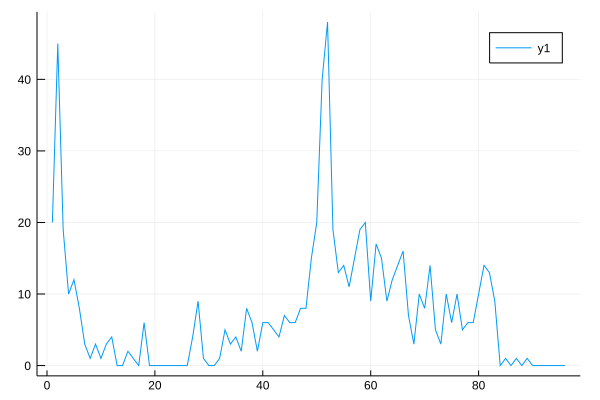

In [10]:
# bin manually 

timebin = zeros(24*4) # Each quarter of each hour gets a bin in the form [H00Q1, ... , H22Q2, H22Q3, ..., H24Q4]

for time in dt_tuples
    timebin[4*time[1] + Int(ceil(time[2] / 15))] += 1
end
plot(timebin)

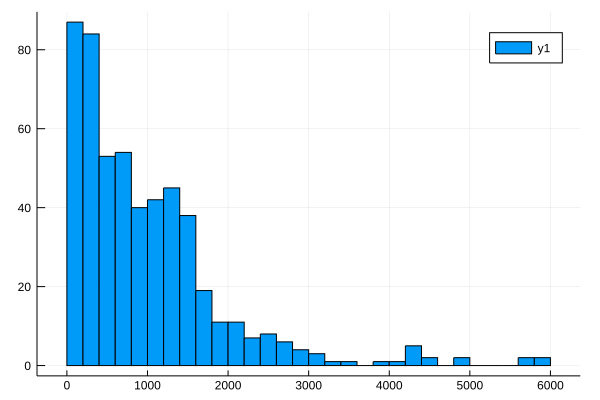

In [11]:
# interarrival times

function get_interarrivals(min_intertime, sorted_vec)
    interarrivals = []
    for i in 1:(length(sorted_vec) - 1)
        if Dates.Minute(sorted_vec[i+1] - sorted_vec[i]) > Dates.Minute(min_intertime)
            push!(interarrivals, Dates.Minute(sorted_dt[i+1] - sorted_dt[i]))
        end
    end
    interarrivals = Dates.value.(interarrivals)
    return interarrivals
end

sorted_dt = sort(randinfractions.datetime)

hourly_interarrivals = get_interarrivals(60, sorted_dt)
histogram(hourly_interarrivals, nbins = 30)

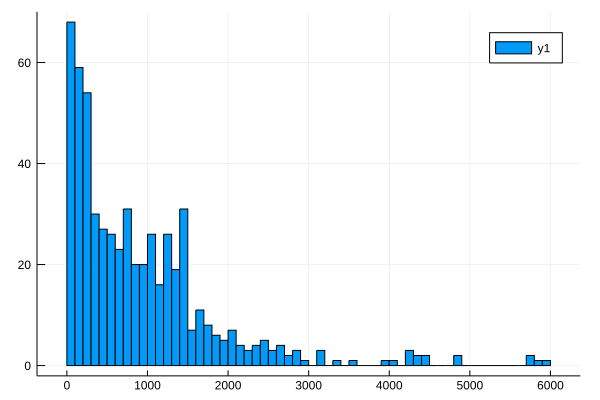

In [12]:
# minutely interarrivals
quarterly_interarrivals = get_interarrivals(15, sorted_dt)
histogram(quarterly_interarrivals, nbins = 24*4)

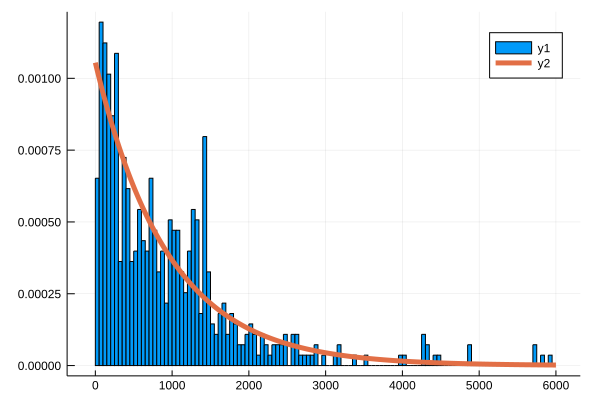

In [81]:
bihourly_interarrivals = get_interarrivals(30, sorted_dt)
histogram(bihourly_interarrivals, nbins = 150, normed=true)

# add pdf plot of fitted exponential
d = fit(Exponential, bihourly_interarrivals)
plot!(x -> pdf(d, x), 0:6000, lw=5)

In [75]:
bihourly_histfit = fit(Histogram, bihourly_interarrivals, nbins=60)

Histogram{Int64,1,Tuple{StepRangeLen{Float64,Base.TwicePrecision{Float64},Base.TwicePrecision{Float64}}}}
edges:
  0.0:100.0:6000.0
weights: [51, 59, 54, 30, 27, 26, 23, 31, 20, 20  …  0, 0, 0, 0, 0, 0, 0, 2, 1, 1]
closed: left
isdensity: false

In [87]:
quarterly_expo = fit(Exponential, quarterly_interarrivals)

Exponential{Float64}(θ=920.6818980667838)

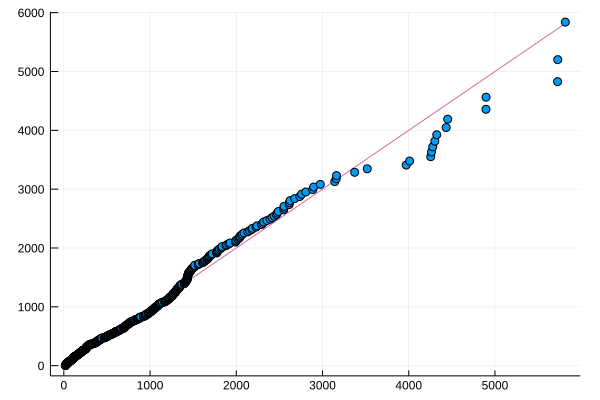

In [86]:
qqplot(quarterly_interarrivals, fit(Exponential, quarterly_interarrivals))

The QQ plot suggests that the interarrivals are exponentially distributed.